# Single cell ATAC-Seq analysis data by 10x cell ranger
Processing possorted_bam.bam file vs different peak files

Basic information about library.
<img src='assets/1.png' width=70%>

Given `peaks.bed` graphics of BARCODE overlaps with peaks.
<img src='assets/2.png' width=70%>

Dowstream analysis - clusterization.
<img src='assets/3.png' width=70%>

# Fragments file processing

In [24]:
import re

# Fragments file provided by cell ranger
fragments_file_gz = '/mnt/stripe/shpynov/2019_sc_ATAC_seq_gxfer1_39174753087306/atac/TWDB-T-CIML007-Baseline_NK_snATAC/outs/fragments.tsv.gz'

# BedTools doesn't work with gz file, so unzip it
!gunzip {fragments_file_gz}
fragments_file = re.sub('\.gz', '', fragments_file_gz)

# Print first line of fragments file
with open(fragments_file, 'r') as fin:        
    for line in fin:        
        print(line)
        break

gzip: /mnt/stripe/shpynov/2019_sc_ATAC_seq_gxfer1_39174753087306/atac/TWDB-T-CIML007-Baseline_NK_snATAC/outs/fragments.tsv.gz: No such file or directory
chr1	10073	10369	AGTCCGGGTCAACTGT-1	1



# Cell Calling

_Cell Ranger ATAC-Seq_

For each barcode, we have the record of mapped high-quality fragments that passed all filters (the fragments.tsv file). Having determined peaks prior to this, we use the number of fragments that overlap any peak regions, for each barcode, to separate the signal from noise. **This works better in practice as compared to naively using the number of fragments per barcode.** We first subtract a depth-dependent fixed count from all barcode counts to model whitelist contamination. This fixed count is the estimated number of fragments per barcode that originated from a different GEM, assuming a contamination rate of 0.02. Then we fit a mixture model of two negative binomial distributions to capture the signal and noise. Setting an odds ratio of 1000, we separate the barcodes that correspond to real cells from the non-cell barcodes.

**We use dumb threshold for now.**

In [39]:
# Intersect using bedtools rather than pybedtools, because they are too slow!
import tempfile
import pandas as pd
import numpy as np
import os
from bokeh.io import output_notebook, show
from bokeh.plotting import figure

output_notebook()


def process_peaks_file(fragments_file, peaks_file, threshold=137):
    ! wc -l {peaks_file}

    idf = None
    ! wc -l {fragments_file}
    with tempfile.NamedTemporaryFile(prefix='intersection', suffix='.bed') as f:
        print('Compute intersection')
        ! bedtools intersect -wa -wb -a {fragments_file} -b {peaks_file} > {f.name}
        ! wc -l {f.name}
        idf = pd.read_csv(f.name, sep='\t', header=None)
        idf.columns = ['chr', 'start', 'end', 'barcode', 'reads', 'peak_chr', 'peak_start', 'peak_end']

    print('Compute unique barcode overlaps')
    pidf = pd.pivot_table(idf, values='reads', index=['barcode'], aggfunc='count')
    pidf.reset_index(level=0, inplace=True)

    counts = sorted(pidf['reads'], reverse=True)
    ns = range(1, len(counts) + 1)
    df_all = pd.DataFrame(data={'count': counts, 'n': ns})
    df_cells = df_all.loc[df_all['count'] >= threshold]
    df_noise = df_all.loc[df_all['count'] < threshold]
    print('Estimated number of cells', len(df_cells))

    # create a new plot (with a title) using figure
    p = figure(plot_width=400, plot_height=400, title="Plots", x_range=(0, 6))
    p.line(np.log10(df_cells['n']), np.log10(df_cells['count']) , line_width=3, line_color='orange', legend='Cell')
    p.line(np.log10(df_noise['n']), np.log10(df_noise['count']) , line_width=3, line_color='blue', legend='Noise')
    p.legend.location = "center_right"
    p.legend.background_fill_color = "#fefefe"
    p.xaxis.axis_label = 'Barcodes'
    p.yaxis.axis_label = 'Fragments overlapping Peaks'
    show(p)
    
    return idf, pidf

Loading BokehJS ...

In [40]:
# 10x Cell ranger single cell ATAC-Seq
idf10x, pidf10x = process_peaks_file(
    fragments_file, '/mnt/stripe/shpynov/2019_sc_ATAC_seq_gxfer1_39174753087306/bam/peaks.bed')

67086 /mnt/stripe/shpynov/2019_sc_ATAC_seq_gxfer1_39174753087306/bam/peaks.bed
77486512 /mnt/stripe/shpynov/2019_sc_ATAC_seq_gxfer1_39174753087306/atac/TWDB-T-CIML007-Baseline_NK_snATAC/outs/fragments.tsv
Compute intersection
56077745 /tmp/intersectionzml69s5r.bed
Compute unique barcode overlaps
Estimated number of cells 10787


In [9]:
# MACS2 processing like in scatac pipeline ATAC-Seq
# MACS2 --no-model --p 1e-4
idfmacs, pidfmacs = process_peaks_file(
    fragments_file, '/mnt/stripe/shpynov/2019_sc_ATAC_seq_gxfer1_39174753087306/bam/macs2_p1e-4.narrowPeak',
    threshold=1000)

492841 /mnt/stripe/shpynov/2019_sc_ATAC_seq_gxfer1_39174753087306/bam/macs2_p1e-4.narrowPeak
77486512 /mnt/stripe/shpynov/2019_sc_ATAC_seq_gxfer1_39174753087306/atac/TWDB-T-CIML007-Baseline_NK_snATAC/outs/fragments.tsv
compute intersection /tmp/intersectioncm2un1vn.bed
['444761766 /tmp/intersectioncm2un1vn.bed']
Total intersection 444761766
Estimated number of cells 11009


In [8]:
# SPAN - --fragment 0 --keep-dup --bin 100
idfspan, pidfspan = process_peaks_file(
    fragments_file, 
    '/mnt/stripe/shpynov/2019_sc_ATAC_seq_gxfer1_39174753087306/bam/span_f0_kd_bin100_fdr1.0E-6_gap5.bed')

105701 /mnt/stripe/shpynov/2019_sc_ATAC_seq_gxfer1_39174753087306/bam/span_f0_kd_bin100_fdr1.0E-6_gap5.bed
77486512 /mnt/stripe/shpynov/2019_sc_ATAC_seq_gxfer1_39174753087306/atac/TWDB-T-CIML007-Baseline_NK_snATAC/outs/fragments.tsv
compute intersection /tmp/intersectionro4z9kh3.bed
['59226768 /tmp/intersectionro4z9kh3.bed']
Total intersection 59226768
Estimated number of cells 10954


# Peak-Barcode Matrix

_Cell Ranger ATAC-Seq_

We produce a count matrix consisting of the counts of fragment ends (or cut sites) within each peak region for each barcode. This is the raw peak-barcode matrix and it captures the enrichment of open chromatin per barcode. The matrix is then filtered to consist of only cell barcodes, which is then used in subsequent analysis such as dimensionality reduction, clustering and visualization.

In [45]:
idf, pidf = idf10x, pidf10x
print('Filtering cells')
cells = set(pidf.loc[pidf['reads'] >= 137]['barcode'])
idfcells = idf.loc[[c in cells for c in idf['barcode']]]

print('Compute barcode overlaps with peaks')
pdf = pd.pivot_table(idfcells, values='reads', 
                     index=['peak_chr', 'peak_start', 'peak_end', 'barcode'], aggfunc=np.sum).reset_index()
pdf['peak'] = pdf['peak_chr'] + ':' + pdf['peak_start'].astype(str) + '-' + pdf['peak_end'].astype(str)
pdf.drop(columns=['peak_chr', 'peak_start', 'peak_end'], inplace=True)
pdf.head()

In [197]:
fulldf = pd.pivot_table(pdf, index='peak', columns='barcode', values='reads').fillna(0)
# Remove extra labels from pivot_table columns
fulldf.columns = fulldf.columns.values
fulldf.index.name = None

In [198]:
fulldf.head()

,AAACGAAAGACCCATT-1,AAACGAAAGACTAATG-1,AAACGAAAGAGGTGGG-1,AAACGAAAGGGCTTCC-1,AAACGAAAGTATGGGC-1,AAACGAAAGTGGTGTG-1,AAACGAAAGTGTTCCA-1,AAACGAAAGTTCGCGC-1,AAACGAACAAAGAGAG-1,AAACGAACAAGTTCGT-1,...,TTTGTGTCAAGTCTCA-1,TTTGTGTCACAACGGA-1,TTTGTGTGTACCTATG-1,TTTGTGTGTAGCTGTT-1,TTTGTGTGTGATGCGA-1,TTTGTGTGTGCCCAGT-1,TTTGTGTGTTTGATCG-1,TTTGTGTTCATCGCCT-1,TTTGTGTTCGCTATAG-1,TTTGTGTTCTCGTAGA-1
chr10:100006265-100006798,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
chr10:100009106-100010528,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,14.0,1.0,0.0,0.0,0.0,6.0,1.0,0.0
chr10:100020324-100020915,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
chr10:100045984-100046443,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
chr10:100167463-100168096,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Dimensionality Reduction, Clustering and t-SNE Projection

_Cell Ranger ATAC-Seq_

For PCA, we first normalize the data to median cut site counts per barcode and log-transform it. We use a fast, scalable and memory efficient implementation of IRLBA (Augmented, Implicitly Restarted Lanczos Bidiagonalization Algorithm) that allows in-place centering and feature scaling and produces the transformed matrix along with the principal components (PC) and singular values encoding the variance explained by each PC. 

Specific to PCA, we provide k-means clustering that produces 2 to 10 clusters for visualization and analysis. We also provide a k-nearest neighbors graph-based clustering method via community detection using louvain modularity optimization algorithm. 

The transformed matrix is operated on by the t-SNE algorithm with default parameters and provides 2-D coordinates for each barcode for visualization.

We also provide an optimized implementation of the Barnes Hut TSNE algorithm (which is the same as the one in our analysis pipeline for the Single Cell Gene Expression Solution). The number of dimensions is fixed to 15 as it was found to sufficiently separate clusters visually and in a biologically meaningful way when tested on peripheral blood mononuclear cells (PBMCs).

In [202]:
# Cell Ranger ATAC-Seq
print('Normalizing the data to median cut site counts per barcode and log-transform it') # Median is 0!
# normalized = fulldf.copy()
# normalized = np.log(normalized / normalized.mean()).replace([-np.inf], 0.0)

from sklearn import preprocessing
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(fulldf.values)
normalized = pd.DataFrame(x_scaled, columns=fulldf.columns, index=fulldf.index)
normalized = np.log(normalized).replace([-np.inf], 0.0)
normalized.head()

Normalizing the data to median cut site counts per barcode and log-transform it


/home/user/anaconda/envs/py35/lib/python3.5/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log
  # Remove the CWD from sys.path while we load stuff.


,AAACGAAAGACCCATT-1,AAACGAAAGACTAATG-1,AAACGAAAGAGGTGGG-1,AAACGAAAGGGCTTCC-1,AAACGAAAGTATGGGC-1,AAACGAAAGTGGTGTG-1,AAACGAAAGTGTTCCA-1,AAACGAAAGTTCGCGC-1,AAACGAACAAAGAGAG-1,AAACGAACAAGTTCGT-1,...,TTTGTGTCAAGTCTCA-1,TTTGTGTCACAACGGA-1,TTTGTGTGTACCTATG-1,TTTGTGTGTAGCTGTT-1,TTTGTGTGTGATGCGA-1,TTTGTGTGTGCCCAGT-1,TTTGTGTGTTTGATCG-1,TTTGTGTTCATCGCCT-1,TTTGTGTTCGCTATAG-1,TTTGTGTTCTCGTAGA-1
chr10:100006265-100006798,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.00000,0.000000,0.0
chr10:100009106-100010528,0.0,0.000000,0.0,0.0,0.0,0.0,-3.258097,-3.091042,0.0,0.0,...,0.0,0.0,-1.232144,-3.610918,0.0,0.0,0.0,-1.89712,-3.091042,0.0
chr10:100020324-100020915,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,...,0.0,0.0,0.000000,-3.610918,0.0,0.0,0.0,0.00000,0.000000,0.0
chr10:100045984-100046443,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.00000,0.000000,0.0
chr10:100167463-100168096,0.0,-3.218876,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.00000,0.000000,0.0


PCA done! Time elapsed 97.15366411209106
Explained variation per principal components 0.09913439672347323


/home/user/anaconda/envs/py35/lib/python3.5/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: The spectral and spectral_r colormap was deprecated in version 2.0. Use nipy_spectral and nipy_spectral_r instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


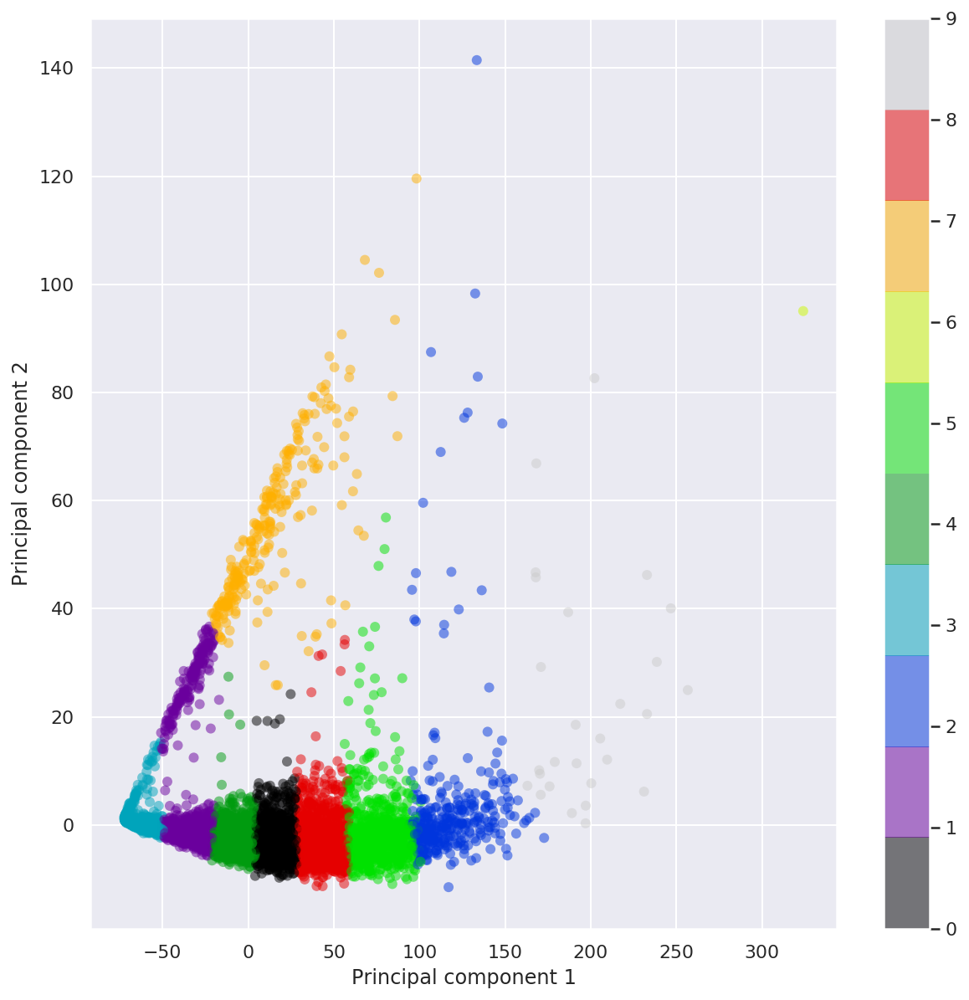

In [203]:
%matplotlib inline
%config InlineBackend.figure_format ='retina'
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import time

    
time_start = time.time()
# Number of dimensions recommended by Cell Ranger ATAC-Seq algorithm
pca = PCA(n_components=15)
pca_result = pca.fit_transform(normalized.transpose())
print('PCA done! Time elapsed', time.time() - time_start)
print('Explained variation per principal components', np.sum(pca.explained_variance_ratio_))

# 2-10 clusters is recommened values by Cell Ranger ATAC-Seq
kmeans = KMeans(n_clusters=10)
kmeans.fit(pca_result)
y_kmeans = kmeans.predict(pca_result)

cmap = plt.cm.get_cmap('spectral', len(set(y_kmeans)))
plt.figure(figsize=(10, 10))
plt.scatter(pca_result[:, 0], pca_result[:, 1], 
            c=y_kmeans, cmap=cmap, 
            edgecolor='none', alpha=0.5)
plt.xlabel('Principal component 1')
plt.ylabel('Principal component 2')
plt.colorbar()
plt.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 10787 samples in 0.008s...
[t-SNE] Computed neighbors for 10787 samples in 0.957s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10787
[t-SNE] Computed conditional probabilities for sample 2000 / 10787
[t-SNE] Computed conditional probabilities for sample 3000 / 10787
[t-SNE] Computed conditional probabilities for sample 4000 / 10787
[t-SNE] Computed conditional probabilities for sample 5000 / 10787
[t-SNE] Computed conditional probabilities for sample 6000 / 10787
[t-SNE] Computed conditional probabilities for sample 7000 / 10787
[t-SNE] Computed conditional probabilities for sample 8000 / 10787
[t-SNE] Computed conditional probabilities for sample 9000 / 10787
[t-SNE] Computed conditional probabilities for sample 10000 / 10787
[t-SNE] Computed conditional probabilities for sample 10787 / 10787
[t-SNE] Mean sigma: 0.703550
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.970024
[t-SNE] Err

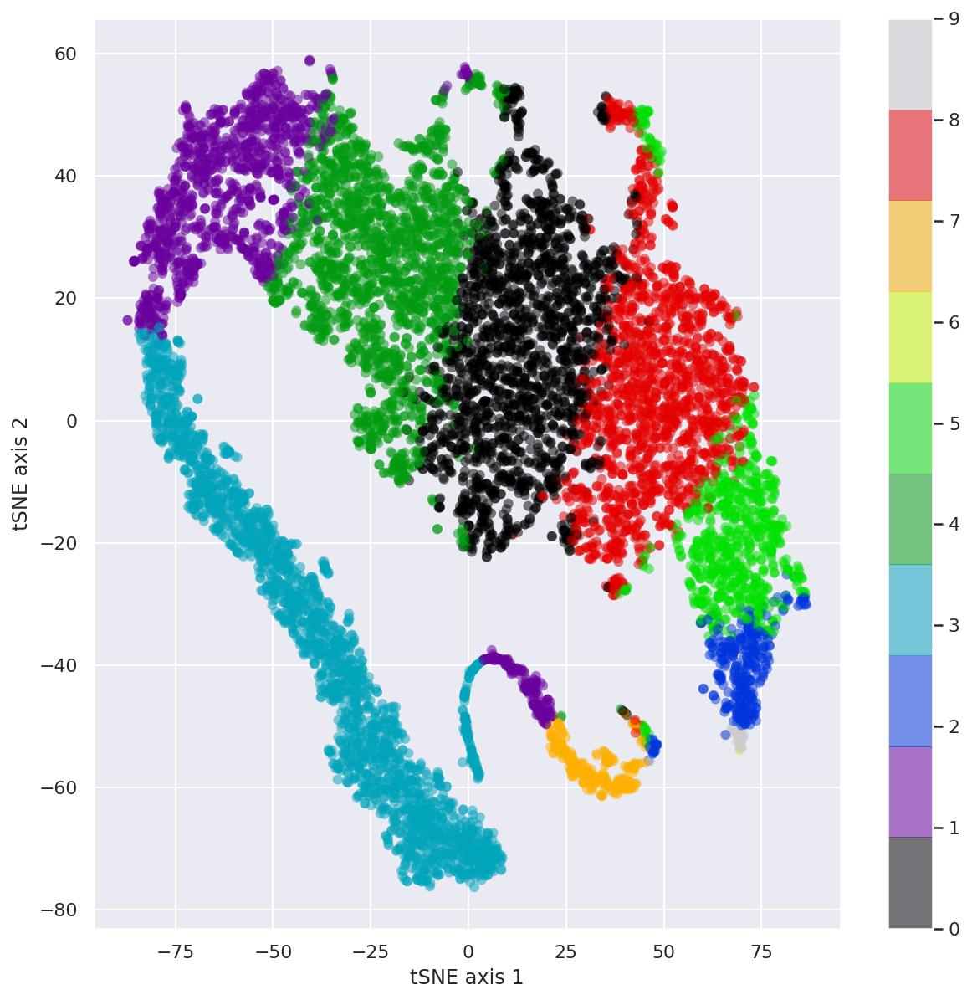

In [204]:
import time
from sklearn.manifold import TSNE

time_start = time.time()
tsne = TSNE(n_components=2, verbose=1)
tsne_pca_results = tsne.fit_transform(pca_result)
print('t-SNE done! Time elapsed', time.time() - time_start)

plt.figure(figsize=(10, 10))
plt.scatter(tsne_pca_results[:,0], tsne_pca_results[:,1], 
            c=y_kmeans, cmap=cmap,
            edgecolor='none', alpha=0.5)
plt.xlabel('tSNE axis 1')
plt.ylabel('tSNE axis 2')
plt.colorbar()
plt.show()

# Preparation the data for single cell explorer
Preprocess data for single cell explorer http://artyomovlab.wustl.edu/shiny/single_cell_explorer

In [201]:
print('Save data_for_plot.tsv')
barcodes = fulldf.transpose().index.values
data_for_plot = pd.DataFrame(
    {'tSNE_1': tsne_pca_results[:,0], 'tSNE_2': tsne_pca_results[:,1], 'Cluster': y_kmeans})
data_for_plot.index = barcodes
data_for_plot.to_csv('data_for_plot.tsv', sep='\t')

print('Save expData.Rda.tsv')
fulldf.to_csv('expData.Rda.tsv', sep='\t')

print('Done')

Save data_for_plot.tsv
Save expData.Rda.tsv
Done


## Convert TSV to Rda in R

*TODO* This should be improved, should save to sparce npz and convert it in R.

```
expData <- read.csv("expData.Rda.tsv", sep="\t")
mExpData <- as.matrix(expData)
save(mExpData, file = "expData.Rda")
```

Upload `data_for_plot.tsv` and `expData.Rda` to corresponding folder and voila! It works.